In [ ]:
import pandas as pd
import numpy as np
import random
import math
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

Uplod Dataset

In [ ]:
from google.colab import files
files.upload()

Saving kendaraan_test.csv to kendaraan_test.csv


{'kendaraan_test.csv': b'Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik\r\nWanita,49,1,8,0,1-2 Tahun,Pernah,46963,26,145,0\r\nPria,22,1,47,1,< 1 Tahun,Tidak,39624,152,241,0\r\nPria,24,1,28,1,< 1 Tahun,Tidak,110479,152,62,0\r\nPria,46,1,8,1,1-2 Tahun,Tidak,36266,124,34,0\r\nPria,35,1,23,0,1-2 Tahun,Pernah,26963,152,229,0\r\nPria,26,1,28,1,< 1 Tahun,Tidak,42721,152,198,0\r\nWanita,24,1,28,1,< 1 Tahun,Tidak,65801,152,160,0\r\nWanita,40,1,28,0,1-2 Tahun,Pernah,30981,26,79,0\r\nPria,23,1,15,1,< 1 Tahun,Tidak,32365,152,219,0\r\nWanita,43,1,28,0,1-2 Tahun,Pernah,65380,25,41,1\r\nWanita,53,1,28,1,1-2 Tahun,Tidak,80184,26,30,0\r\nPria,28,1,46,1,< 1 Tahun,Tidak,25657,152,133,0\r\nPria,24,1,21,1,< 1 Tahun,Tidak,35817,152,35,0\r\nWanita,21,1,22,1,< 1 Tahun,Tidak,29404,160,249,0\r\nWanita,23,1,36,0,< 1 Tahun,Pernah,36266,152,235,0\r\nPria,21,1,36,1,< 1 Tahun,Tidak,2630,152,93,0\r\nWanita,22,1,21,1,< 1 Tahun,Tidak,445

In [ ]:
from google.colab import files
files.upload()

Saving kendaraan_train.csv to kendaraan_train.csv


{'kendaraan_train.csv': b'id,Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik\r\n1,Wanita,30,1,33,1,< 1 Tahun,Tidak,28029,152,97,0\r\n2,Pria,48,1,39,0,> 2 Tahun,Pernah,25800,29,158,0\r\n3,,21,1,46,1,< 1 Tahun,Tidak,32733,160,119,0\r\n4,Wanita,58,1,48,0,1-2 Tahun,Tidak,2630,124,63,0\r\n5,Pria,50,1,35,0,> 2 Tahun,,34857,88,194,0\r\n6,Pria,21,1,35,1,< 1 Tahun,Tidak,22735,152,171,0\r\n7,Wanita,33,1,8,0,,Pernah,32435,124,215,1\r\n8,Pria,23,,28,1,< 1 Tahun,Tidak,26869,152,222,0\r\n9,Wanita,20,1,8,1,< 1 Tahun,Tidak,30786,160,31,0\r\n10,,54,1,29,0,> 2 Tahun,Pernah,88883,124,28,1\r\n11,Pria,25,1,14,1,< 1 Tahun,Tidak,34212,152,282,0\r\n12,Wanita,,1,28,1,< 1 Tahun,Tidak,40754,152,210,0\r\n13,Wanita,21,1,12,1,< 1 Tahun,,27907,160,232,0\r\n14,Wanita,21,1,,1,< 1 Tahun,Tidak,36598,152,140,0\r\n15,Pria,66,1,24,1,1-2 Tahun,Tidak,38616,145,281,0\r\n16,Pria,31,1,8,0,< 1 Tahun,Pernah,2630,152,132,0\r\n17,Wanita,24,1,30,1,< 1 

In [ ]:
df = pd.read_csv("kendaraan_train.csv")

Melihat cuplikan data

In [ ]:
df.head()

,id,Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik
0,1,Wanita,30.0,1.0,33.0,1.0,< 1 Tahun,Tidak,28029.0,152.0,97.0,0
1,2,Pria,48.0,1.0,39.0,0.0,> 2 Tahun,Pernah,25800.0,29.0,158.0,0
2,3,NaN,21.0,1.0,46.0,1.0,< 1 Tahun,Tidak,32733.0,160.0,119.0,0
3,4,Wanita,58.0,1.0,48.0,0.0,1-2 Tahun,Tidak,2630.0,124.0,63.0,0
4,5,Pria,50.0,1.0,35.0,0.0,> 2 Tahun,NaN,34857.0,88.0,194.0,0


Melihat info data

In [ ]:
missing_datadf = df.isnull()
missing_datadf 

,id,Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik
0,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,True,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
285826,False,False,False,False,False,False,False,False,False,False,False,False
285827,False,False,False,False,False,False,False,False,False,False,False,False
285828,False,False,False,False,False,False,False,False,False,False,False,False
285829,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
for column in missing_datadf.columns.values.tolist():
  print(column)
  print(missing_datadf[column].value_counts())
  print("")

id
False    285831
Name: id, dtype: int64

Jenis_Kelamin
False    271391
True      14440
Name: Jenis_Kelamin, dtype: int64

Umur
False    271617
True      14214
Name: Umur, dtype: int64

SIM
False    271427
True      14404
Name: SIM, dtype: int64

Kode_Daerah
False    271525
True      14306
Name: Kode_Daerah, dtype: int64

Sudah_Asuransi
False    271602
True      14229
Name: Sudah_Asuransi, dtype: int64

Umur_Kendaraan
False    271556
True      14275
Name: Umur_Kendaraan, dtype: int64

Kendaraan_Rusak
False    271643
True      14188
Name: Kendaraan_Rusak, dtype: int64

Premi
False    271262
True      14569
Name: Premi, dtype: int64

Kanal_Penjualan
False    271532
True      14299
Name: Kanal_Penjualan, dtype: int64

Lama_Berlangganan
False    271839
True      13992
Name: Lama_Berlangganan, dtype: int64

Tertarik
False    285831
Name: Tertarik, dtype: int64



In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 285831 entries, 0 to 285830
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   id                 285831 non-null  int64  
 1   Jenis_Kelamin      271391 non-null  object 
 2   Umur               271617 non-null  float64
 3   SIM                271427 non-null  float64
 4   Kode_Daerah        271525 non-null  float64
 5   Sudah_Asuransi     271602 non-null  float64
 6   Umur_Kendaraan     271556 non-null  object 
 7   Kendaraan_Rusak    271643 non-null  object 
 8   Premi              271262 non-null  float64
 9   Kanal_Penjualan    271532 non-null  float64
 10  Lama_Berlangganan  271839 non-null  float64
 11  Tertarik           285831 non-null  int64  
dtypes: float64(7), int64(2), object(3)
memory usage: 26.2+ MB


Drop dataset

In [ ]:
df.drop('id', axis = 1, inplace = True)
df

,Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik
0,Wanita,30.0,1.0,33.0,1.0,< 1 Tahun,Tidak,28029.0,152.0,97.0,0
1,Pria,48.0,1.0,39.0,0.0,> 2 Tahun,Pernah,25800.0,29.0,158.0,0
2,NaN,21.0,1.0,46.0,1.0,< 1 Tahun,Tidak,32733.0,160.0,119.0,0
3,Wanita,58.0,1.0,48.0,0.0,1-2 Tahun,Tidak,2630.0,124.0,63.0,0
4,Pria,50.0,1.0,35.0,0.0,> 2 Tahun,NaN,34857.0,88.0,194.0,0
...,...,...,...,...,...,...,...,...,...,...,...
285826,Wanita,23.0,1.0,4.0,1.0,< 1 Tahun,Tidak,25988.0,152.0,217.0,0
285827,Wanita,21.0,1.0,46.0,1.0,< 1 Tahun,Tidak,44686.0,152.0,50.0,0
285828,Wanita,23.0,1.0,50.0,1.0,< 1 Tahun,Tidak,49751.0,152.0,226.0,0
285829,Pria,68.0,1.0,7.0,1.0,1-2 Tahun,Tidak,30503.0,124.0,270.0,0


Kategori ke Numerik

In [ ]:
numdata = pd.DataFrame(columns = ['Umur','Kode_Daerah','Premi','Kanal_Penjualan','Lama_Berlangganan'])
numdata['Umur'] = df['Umur']
numdata['Kode_Daerah'] = df['Kode_Daerah']
numdata['Premi'] = df['Premi']
numdata['Kanal_Penjualan'] = df['Kanal_Penjualan']
numdata['Lama_Berlangganan'] = df['Lama_Berlangganan']
numdata

,Umur,Kode_Daerah,Premi,Kanal_Penjualan,Lama_Berlangganan
0,30.0,33.0,28029.0,152.0,97.0
1,48.0,39.0,25800.0,29.0,158.0
2,21.0,46.0,32733.0,160.0,119.0
3,58.0,48.0,2630.0,124.0,63.0
4,50.0,35.0,34857.0,88.0,194.0
...,...,...,...,...,...
285826,23.0,4.0,25988.0,152.0,217.0
285827,21.0,46.0,44686.0,152.0,50.0
285828,23.0,50.0,49751.0,152.0,226.0
285829,68.0,7.0,30503.0,124.0,270.0


Handling outlier

Box plot

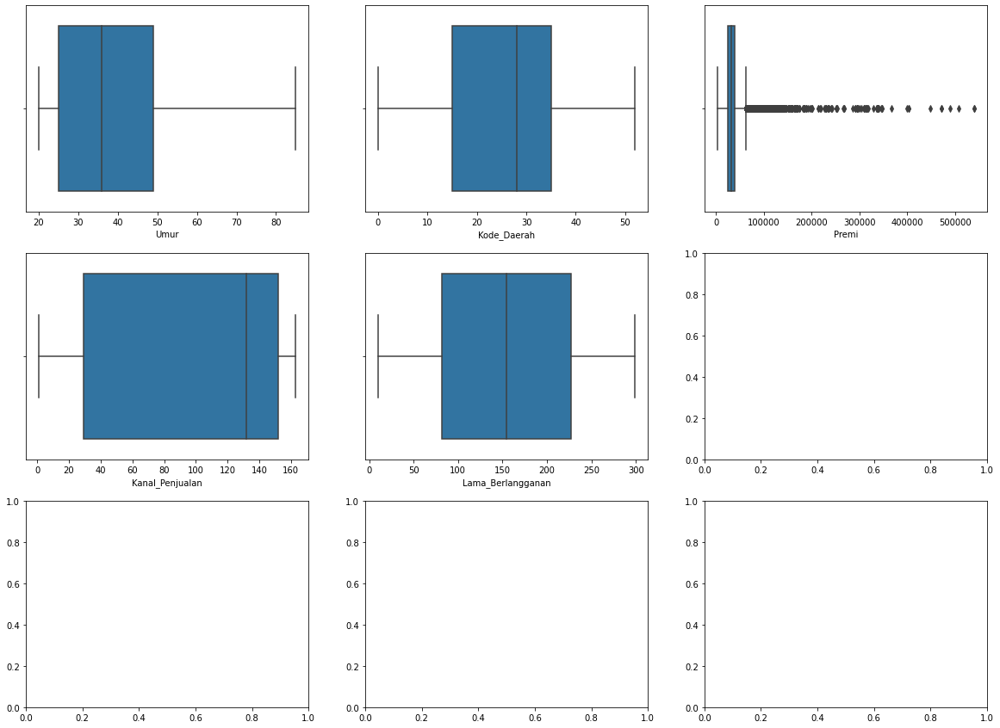

In [ ]:
def outliers(x) : 
  q1 = x.quantile(0.25)
  q3 = x.quantile(0.75)
  iqr = q3 - q1
  low = q1 - (1.5*iqr)
  up = q3 + (1.5*iqr)

  return low, up 

#melihat batas bawah dan atas outliers
Umur_low, Umur_up = outliers(numdata['Umur'])
Kode_Daerah_low, Kode_Daerah_up = outliers(numdata['Kode_Daerah'])
Premi_low, Premi_up = outliers(numdata['Premi'])
Kanal_Penjualan_low, Kanal_Penjualan_up = outliers(numdata['Kanal_Penjualan'])
Lama_Berlanganan_low, Lama_Berlangganan_up = outliers(numdata['Lama_Berlangganan'])
 

fig, axes = plt.subplots(ncols = 3, nrows = 3, figsize = (20,15))
for i, ax in zip(numdata.columns, axes.flat) : 
  sns.boxplot(x=numdata[i], ax=ax)
plt.show()

Kolerasi

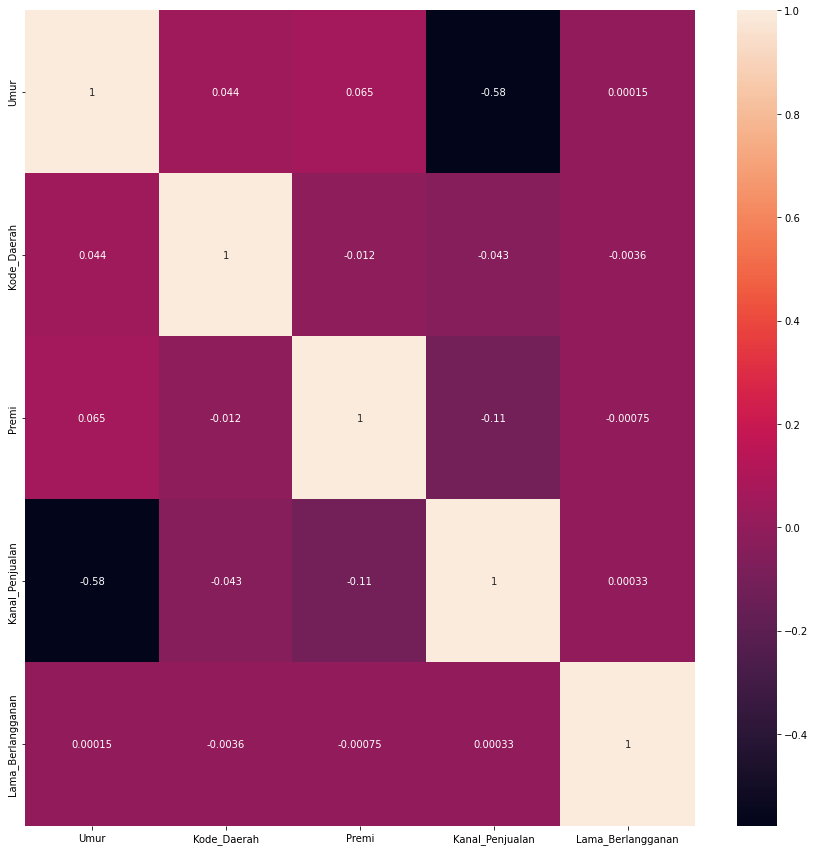

In [ ]:
corr = numdata.corr()

plt.figure(figsize = (15,15))
sns.heatmap(corr, annot = True)

Normalisasi

In [ ]:
columns_new = numdata.columns

In [ ]:
scaler = MinMaxScaler()
norm_data = scaler.fit_transform(numdata)
norm_data_scalled = pd.DataFrame(norm_data, columns = columns_new)

norm_data_scalled

,Umur,Kode_Daerah,Premi,Kanal_Penjualan,Lama_Berlangganan
0,0.153846,0.634615,0.047251,0.932099,0.301038
1,0.430769,0.750000,0.043104,0.172840,0.512111
2,0.015385,0.884615,0.056002,0.981481,0.377163
3,0.584615,0.923077,0.000000,0.759259,0.183391
4,0.461538,0.673077,0.059953,0.537037,0.636678
...,...,...,...,...,...
285826,0.046154,0.076923,0.043454,0.932099,0.716263
285827,0.015385,0.884615,0.078239,0.932099,0.138408
285828,0.046154,0.961538,0.087661,0.932099,0.747405
285829,0.738462,0.134615,0.051853,0.759259,0.899654


K-Menas

In [ ]:
def euclidean_distance (x1,x2) : 
    return np.sqrt(np.sum((x1-x2)**2))

In [ ]:
class KMeans_scratch : 
    def __init__(self, K=2, maks_iteration=150): 
        self.K = K
        self.maks_iteration = maks_iteration
        self.centroids = []
        self.clusters = [[] for i in range(self.K)]
  
    def predict(self, X) : 
        self.X = X
        self.baris , self.column = X.shape

        # RANDOM CENTROID 
        centroid_indexes = np.random.choice(self.baris,self.K,replace=False)
        for index in centroid_indexes : 
            self.centroids.append(self.X[index])

        # ITERASI SEBANYAK MAKS ITERASI ATAU CENTROID TIDAK BERUBAH POSISI
        for i in range(self.maks_iteration) : 

            # MENENTUKAN CLUSTER ATAU CENTROID TERDEKAT SETIAP TITIK
            clusters = [[] for i in range(self.K)]
            for idx, row in enumerate(self.X) : 
                # MENCARI CENTROID TERDEKAT DENGAN MEMBANDINGKAN JARAK CENTROID 
                closest_centroids_index = self.select_nearest_centroid(row)
                clusters[closest_centroids_index].append(idx)
                
            self.clusters = clusters

            # UPDATE CENTROID
            old_centroids = self.centroids
            self.centroids = self.generate_new_centroids()

            # CEK APAKAH CENTROID BERUBAH ATAU TIDAK
            isChange = False
            for i,old_centroid in enumerate(old_centroids) : 
                # MENGHITUNG JARAK OLD CENTROID DAN NEW CENTROID
                distance = euclidean_distance(old_centroid, self.centroids[i])
                if (distance != 0) :
                    isChange = True
            if (isChange == False) : 
                break

        # MENENTUKAN LABEL KLASTERISASI
        labels = self.generate_labels()
        return labels

    def select_nearest_centroid(self, row) : 
        distance_to_all_centroids = [euclidean_distance(row,centroid) for centroid in self.centroids]
        return np.argmin(distance_to_all_centroids)

    def generate_new_centroids(self) : 
        centroids = np.zeros((self.K, self.column))
        for cluster_idx, cluster in enumerate(self.clusters) : 
            new_centroids = np.mean(self.X[cluster], axis=0)
            centroids[cluster_idx] = new_centroids
        return centroids

    def generate_labels(self) : 
        labels = np.empty(self.baris)
        for cluster_idx, cluster in enumerate(self.clusters):
            for row in cluster:
                labels[row] = cluster_idx
        return labels

Eksperimen 1

In [ ]:
data1 = df.loc[:, ("Umur", "Premi")]
data1.head()

,Umur,Premi
0,30.0,28029.0
1,48.0,25800.0
2,21.0,32733.0
3,58.0,2630.0
4,50.0,34857.0


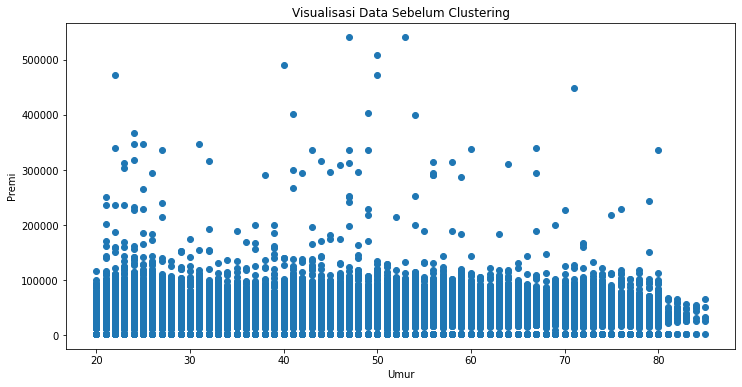

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
ax.scatter(data1.iloc[:,0] , data1.iloc[:,1] )
ax.set_xlabel(data1.columns[0])
ax.set_ylabel(data1.columns[1])
plt.title("Visualisasi Data Sebelum Clustering")
plt.show()

Nilai K yang terbaik

In [ ]:
X1 = data1.to_numpy()
X1.shape

(285831, 2)

In [ ]:
k_range = range(1,10)
sse = []
for i in k_range : 
    km = KMeans(n_clusters=i)
    km.fit(X1)
    sse.append(km.inertia_)
sse

ValueError: ignored

Clustering

In [ ]:
model = KMeans_scratch(K=3,maks_iteration=10)
y1_pred = model.predict(X1)

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


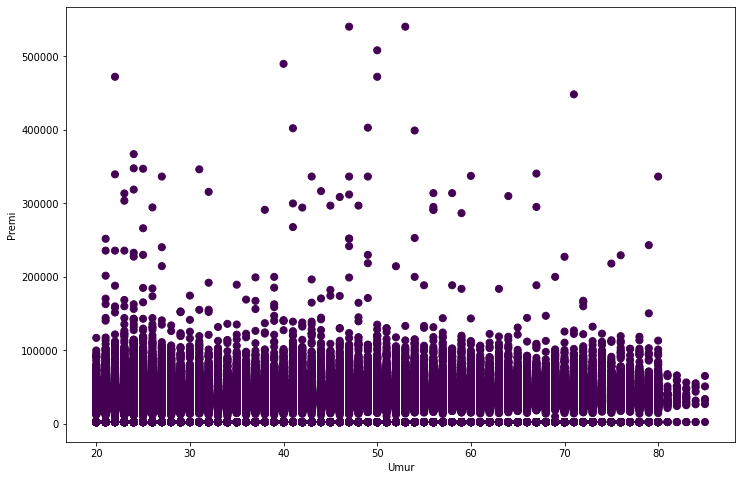

In [ ]:
plt.figure(figsize=(12,8))
plt.scatter(X1[:, 0], X1[:, 1], c=y1_pred, s=50)

centroid = model.centroids
plt.scatter(centroid[:, 0], centroid[:, 1], c='red',marker="x", linewidths=2)
plt.xlabel(data1.columns[0])
plt.ylabel(data1.columns[1])
plt.show()